In [1]:
import arviz as az
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pymc as pm
import scipy.stats as stats
import helpsk as hlp

import source.pymc_helpers as ph

%config InlineBackend.figure_format = 'retina'
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


# Data

In [2]:
data = pd.read_csv("/code/data/Howell1.csv", sep=";", header=0)
print(len(data))
data.head()

544


,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0


In [3]:
hlp.pandas.numeric_summary(data)

,# of Non-Nulls,# of Nulls,% Nulls,# of Zeros,% Zeros,Mean,St Dev.,Coef of Var,Skewness,Kurtosis,Min,10%,25%,50%,75%,90%,Max
height,544,0,0.0%,0,0.0%,138.3,27.6,0.2,-1.3,0.6,54.0,91.4,125.1,148.6,157.5,162.6,179.1
weight,544,0,0.0%,0,0.0%,35.6,14.7,0.4,-0.5,-0.9,4.2,12.5,22.0,40.1,47.2,51.6,63.0
age,544,0,0.0%,11,2.0%,29.3,20.8,0.7,0.5,-0.5,0.0,3.0,12.0,27.0,43.0,58.0,88.0
male,544,0,0.0%,287,53.0%,0.5,0.5,1.1,0.1,-2.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0


---

# Model - Linear

In [4]:
data_adults = data[data.age >= 18]  # only adults

x_bar = data_adults.weight.mean()
with pm.Model() as model_linear:
    # this is so we can update the data to make out of sample predictions
    X = pm.MutableData("X", data_adults.weight.values)
    y = pm.MutableData("y", data_adults.height.values)

    a = pm.Normal("a", mu=178, sigma=20)
    # lognormal means there will be >0 relationship between b (weight) and height
    # i.e. we are explicitly stating that negative relationships don't make sense
    # b = pm.Normal("b", mu=0, sigma=20)
    b = pm.Lognormal("b", mu=0, sigma=1)
    sigma = pm.Uniform("sigma", 0, 50)
    # mu = a + np.exp(b) * (d2.weight.values - xbar)
    # mu = a + np.exp(b) * (np.zeros(len(d2)) - d2.weight.mean())
    mu = a + b * (X - x_bar)
    height = pm.Normal("height", mu=mu, sigma=sigma, observed=y)
    # trace_4_3b = pm.sample(1000, tune=1000)
    idata_prior = pm.sample_prior_predictive(samples=100, random_seed=RANDOM_SEED)

Sampling: [a, b, height, sigma]


# Prior Checks

In [5]:
prior_samples_b = ph.get_prior_samples(idata_prior, variable_name='b').flatten()

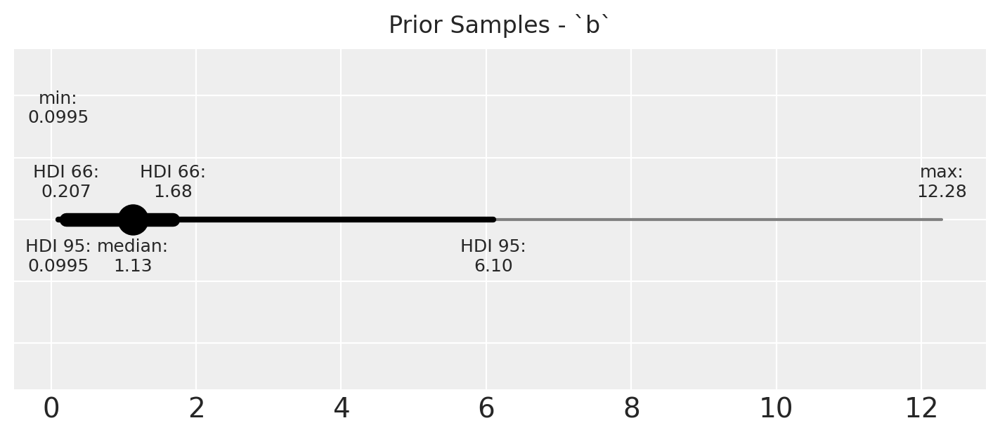

In [6]:
from helpsk.string import format_number

sim_min, sim_median, sim_max = np.quantile(prior_samples_b, q=[0, 0.5, 1])
sim_95_hdi_prob_low, sim_95_hdi_prob_hi = az.hdi(prior_samples_b, hdi_prob=0.95)
sim_66_hdi_prob_low, sim_66_hdi_prob_hi = az.hdi(prior_samples_b, hdi_prob=0.66)

def plot_text(x, label, above=True, mult=1):
    y = 0.012
    y *= mult
    if not above:
        y *= -1
    return plt.text(x=x, y=y, s=f"{label}:\n{format_number(x)}", ha='center', va='center', fontsize=9)

fig, ax = plt.subplots(1)
plt.plot([sim_min, sim_max], [0, 0], color='gray')
plt.plot([sim_95_hdi_prob_low, sim_95_hdi_prob_hi], [0, 0], color='black', linewidth=3)
plt.plot([sim_66_hdi_prob_low, sim_66_hdi_prob_hi], [0, 0], color='black', linewidth=7)
plt.plot(sim_median, 0, 'o', markersize=15, color='black')
ax.set_yticklabels([])
plot_text(x=sim_min, label='min', mult=3)
plot_text(x=sim_max, label="max")
plot_text(x=sim_median, label="median", above=False)
plot_text(x=sim_66_hdi_prob_low, label="HDI 66")
plot_text(x=sim_66_hdi_prob_hi, label="HDI 66")
plot_text(x=sim_95_hdi_prob_low, label="HDI 95", above=False)
plot_text(x=sim_95_hdi_prob_hi, label="HDI 95", above=False)
fig.set_size_inches(w=7, h=3)
# plt.xlim((115, 195))
plt.suptitle("Prior Samples - `b`");

In [7]:
prior_samples_target = ph.get_prior_samples(idata_prior).flatten()

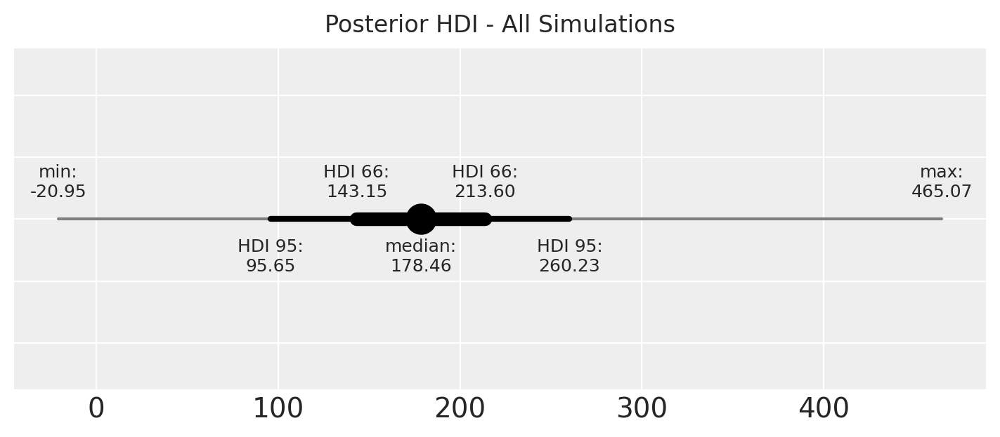

In [8]:
from helpsk.string import format_number

sim_min, sim_median, sim_max = np.quantile(prior_samples_target, q=[0, 0.5, 1])
sim_95_hdi_prob_low, sim_95_hdi_prob_hi = az.hdi(prior_samples_target, hdi_prob=0.95)
sim_66_hdi_prob_low, sim_66_hdi_prob_hi = az.hdi(prior_samples_target, hdi_prob=0.66)

def plot_text(x, label, above=True):
    y = 0.012
    if not above:
        y *= -1
    return plt.text(x=x, y=y, s=f"{label}:\n{format_number(x)}", ha='center', va='center', fontsize=9)

fig, ax = plt.subplots(1)
plt.plot([sim_min, sim_max], [0, 0], color='gray')
plt.plot([sim_95_hdi_prob_low, sim_95_hdi_prob_hi], [0, 0], color='black', linewidth=3)
plt.plot([sim_66_hdi_prob_low, sim_66_hdi_prob_hi], [0, 0], color='black', linewidth=7)
plt.plot(sim_median, 0, 'o', markersize=15, color='black')
ax.set_yticklabels([])
plot_text(x=sim_min, label='min')
plot_text(x=sim_max, label="max")
plot_text(x=sim_median, label="median", above=False)
plot_text(x=sim_66_hdi_prob_low, label="HDI 66")
plot_text(x=sim_66_hdi_prob_hi, label="HDI 66")
plot_text(x=sim_95_hdi_prob_low, label="HDI 95", above=False)
plot_text(x=sim_95_hdi_prob_hi, label="HDI 95", above=False)
fig.set_size_inches(w=7, h=3)
# plt.xlim((115, 195))
plt.suptitle("Posterior HDI - All Simulations");

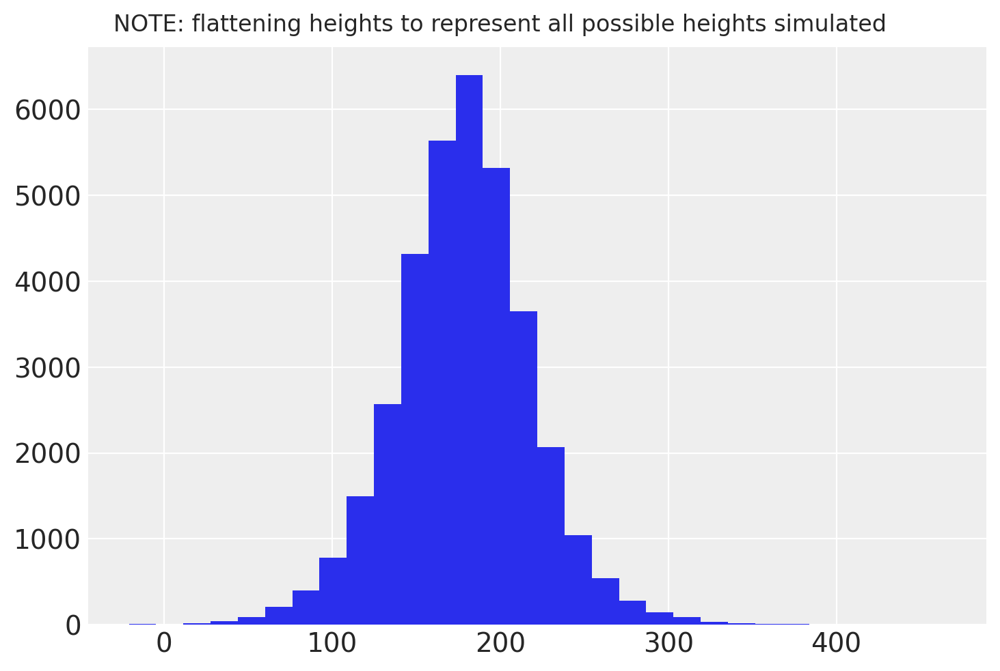

In [9]:
plt.hist(prior_samples_target, bins=30)
plt.suptitle('NOTE: flattening heights to represent all possible heights simulated');

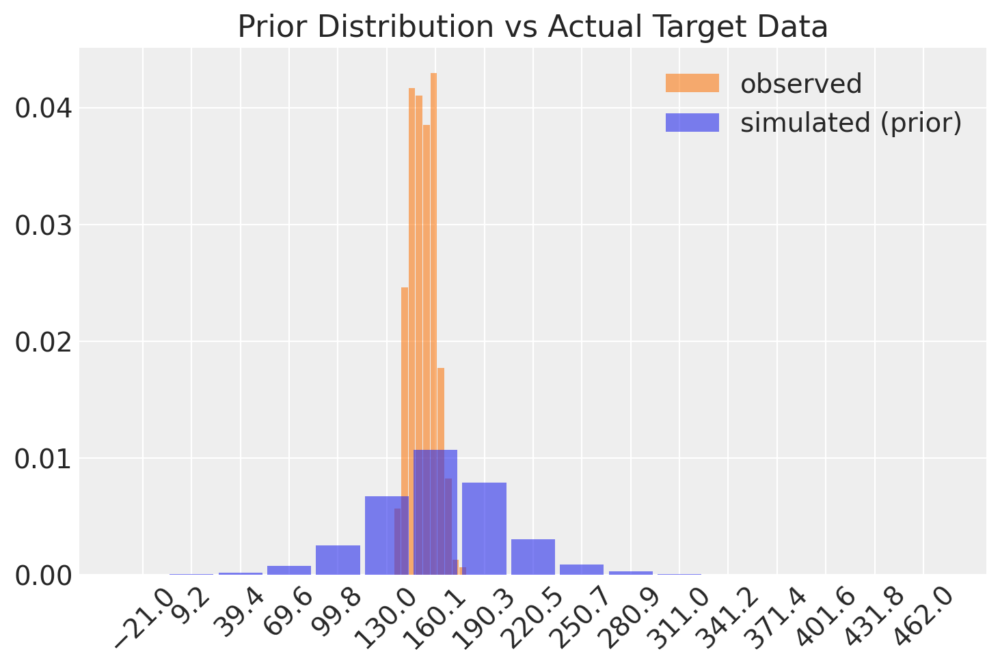

In [10]:
az.plot_dist(
    data_adults['height'],
    kind="hist",
    color="C1",
    hist_kwargs=dict(alpha=0.6),
    label="observed",
)
az.plot_dist(
    idata_prior.prior_predictive["height"],
    kind="hist",
    hist_kwargs=dict(alpha=0.6),
    label="simulated (prior)",
)
plt.xticks(rotation=45)
plt.title('Prior Distribution vs Actual Target Data');

# Posterior

In [11]:
with model_linear:
    # Train model
    idata_posterior = pm.sample(draws=1000, tune=1000)
    # Get samples from the posterior (predictions i.e. associated with the observed data)
    idata_predictive = pm.sample_posterior_predictive(
        idata_posterior,
        random_seed=RANDOM_SEED
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.
Sampling: [height]


## Model Parameters

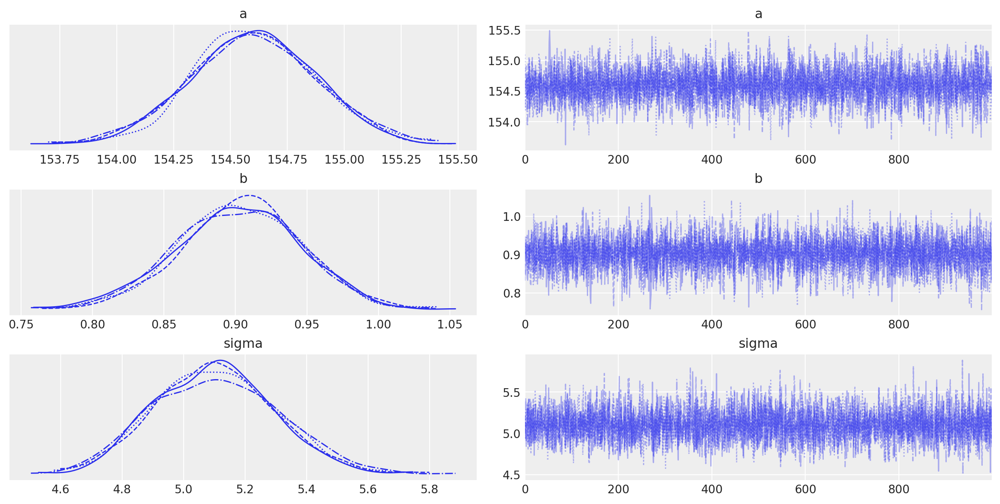

In [12]:
az.plot_trace(idata_posterior);

In [13]:
az.summary(idata_posterior, kind="stats")

,mean,sd,hdi_3%,hdi_97%
a,154.601,0.275,154.091,155.130
b,0.903,0.043,0.822,0.984
sigma,5.103,0.196,4.737,5.459


### Comparison w/ `statsmodels` linear regression

In [14]:
import statsmodels.api as sm

ols_x = data_adults[['weight']] - data_adults['weight'].mean()
ols_y = data_adults['height']

ols_x = sm.add_constant(ols_x)
ols_model = sm.OLS(ols_y, ols_x).fit() 
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:                 height   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.568
Method:                 Least Squares   F-statistic:                     463.3
Date:                Sun, 15 Jan 2023   Prob (F-statistic):           4.68e-66
Time:                        21:11:36   Log-Likelihood:                -1071.0
No. Observations:                 352   AIC:                             2146.
Df Residuals:                     350   BIC:                             2154.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        154.5971      0.271    570.253      0.0

In [15]:
import plotly_express as px

ols_predictions = ols_model.predict(ols_x)
temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Predicted Heights (OLS)"] = ols_predictions

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Predicted Heights (OLS)",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Prediction (OLS)<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)

perfect_line = px.line(
    pd.DataFrame(dict(x=np.arange(135, 180), y=np.arange(135, 180))),
    x='x',
    y='y',
)
perfect_line.update_traces(line_color='red', line_width=2)
fig.add_trace(perfect_line.data[0])
fig


---

## Target Variable

/usr/local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



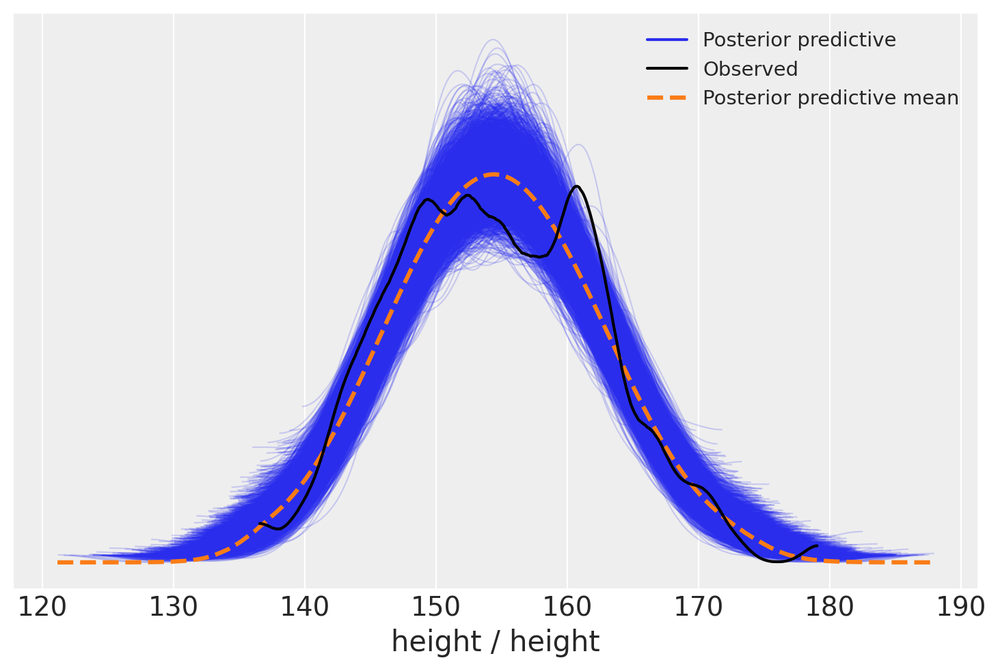

In [16]:
az.plot_ppc(idata_predictive);

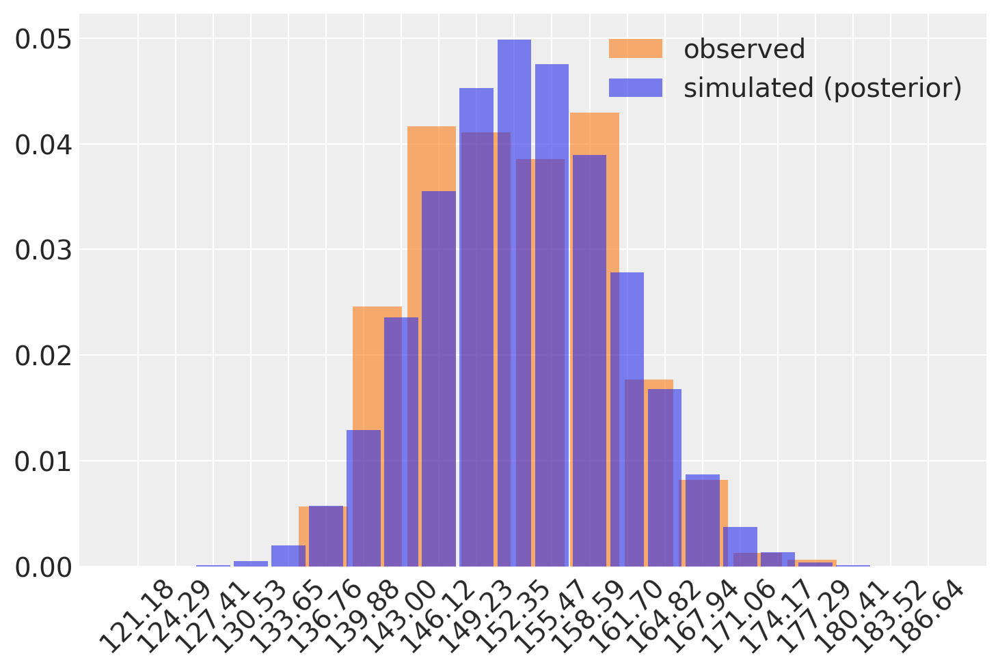

In [17]:

az.plot_dist(
    data_adults['height'],
    kind="hist",
    color="C1",
    hist_kwargs=dict(alpha=0.6),
    label="observed",
)
az.plot_dist(
    idata_predictive.posterior_predictive["height"],
    kind="hist",
    hist_kwargs=dict(alpha=0.6),
    label="simulated (posterior)",
)
plt.xticks(rotation=45);

In [18]:
prediction_simulations = ph.get_posterior_samples(idata_predictive)
prediction_simulations.shape

(352, 4000)

In [19]:
print(prediction_simulations.min().min())
print(prediction_simulations.max().max())

121.17720079122977
187.96768502664733


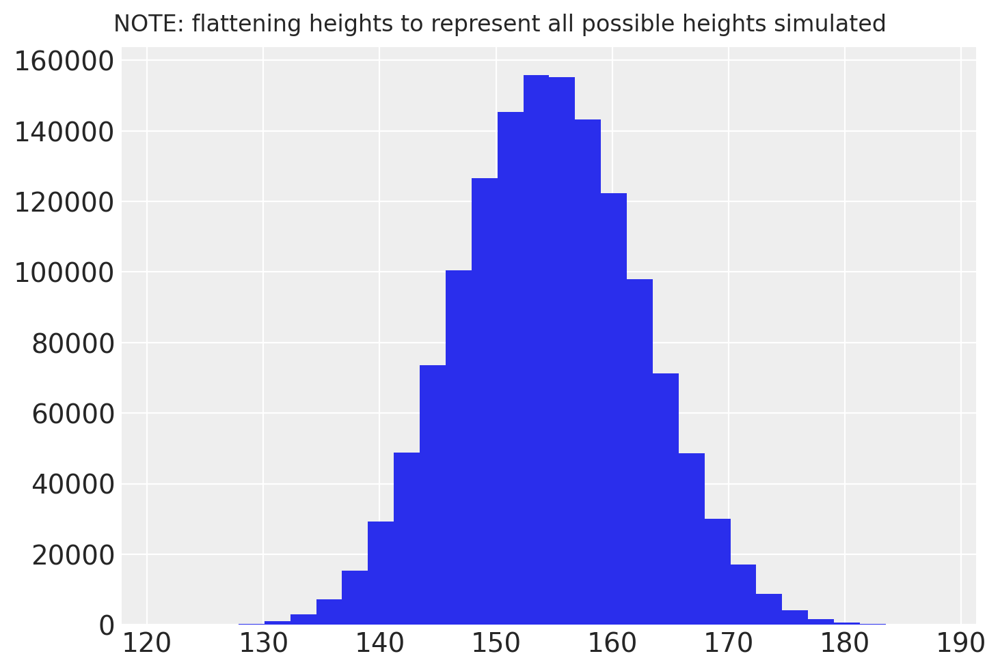

In [20]:
plt.hist(prediction_simulations.flatten(), bins=30)
plt.suptitle('NOTE: flattening heights to represent all possible heights simulated');

Each height is associated with `4000` simulated values. Now get the median/expected value and plot histogram of median values just to see the difference.

In [21]:
print(np.median(prediction_simulations, axis=1).min())
print(np.median(prediction_simulations, axis=1).max())

142.08529610399955
170.8233313542098


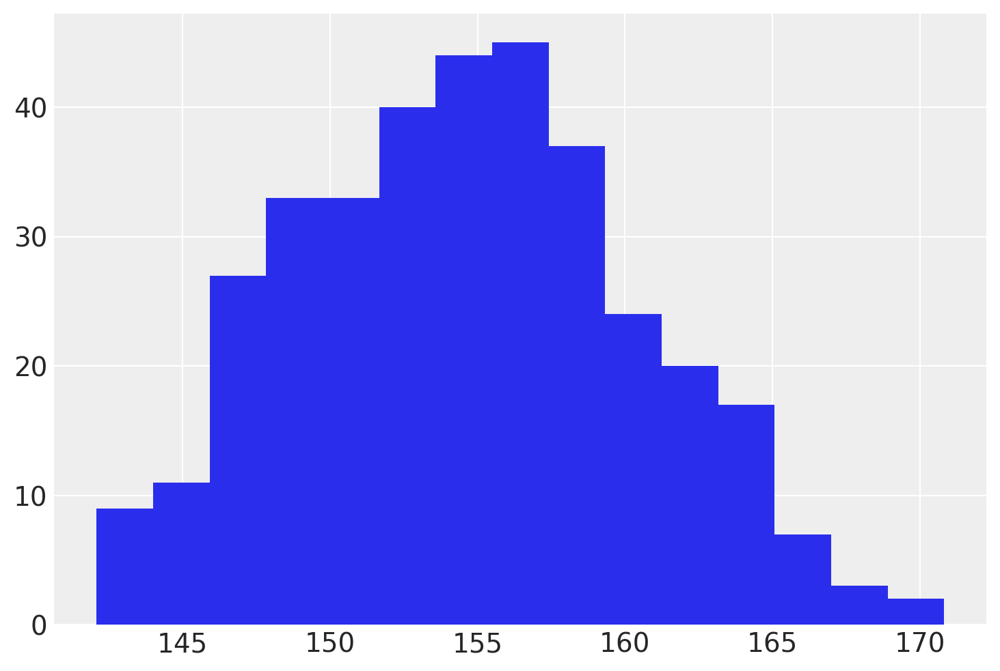

In [22]:
plt.hist(np.median(prediction_simulations, axis=1), bins=15);

In [23]:
az.summary(idata_posterior, kind="stats")

,mean,sd,hdi_3%,hdi_97%
a,154.601,0.275,154.091,155.130
b,0.903,0.043,0.822,0.984
sigma,5.103,0.196,4.737,5.459


In [24]:
az.summary(idata_predictive, kind="stats")

/usr/local/lib/python3.10/site-packages/arviz/stats/stats.py:1351: UserWarning:

Selecting first found group: posterior_predictive



,mean,sd,hdi_3%,hdi_97%
height[0],157.246,5.109,147.736,166.927
height[1],146.828,5.144,137.699,156.887
height[2],142.768,5.233,133.055,152.612
height[3],161.987,5.154,152.586,171.941
height[4],151.142,5.097,142.171,161.336
...,...,...,...,...
height[347],156.425,5.002,147.184,165.613
height[348],144.987,5.186,134.974,154.570
height[349],161.091,5.010,151.582,170.365
height[350],162.841,5.013,153.397,172.151


In [25]:
posterior_target_samples = ph.get_posterior_samples(idata_predictive)
posterior_target_point_predictions = np.median(posterior_target_samples, axis=1)
assert posterior_target_samples.shape[0] == len(posterior_target_point_predictions)

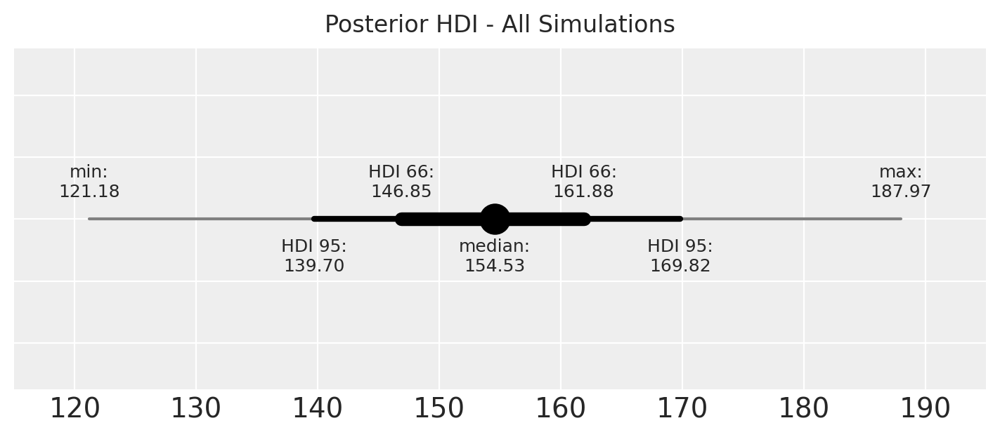

In [26]:
from helpsk.string import format_number

samples_flattened = posterior_target_samples.flatten()

sim_min, sim_median, sim_max = np.quantile(samples_flattened, q=[0, 0.5, 1])
sim_95_hdi_prob_low, sim_95_hdi_prob_hi = az.hdi(samples_flattened, hdi_prob=0.95)
sim_66_hdi_prob_low, sim_66_hdi_prob_hi = az.hdi(samples_flattened, hdi_prob=0.66)

def plot_text(x, label, above=True):
    y = 0.012
    if not above:
        y *= -1
    return plt.text(x=x, y=y, s=f"{label}:\n{format_number(x)}", ha='center', va='center', fontsize=9)

fig, ax = plt.subplots(1)
plt.plot([sim_min, sim_max], [0, 0], color='gray')
plt.plot([sim_95_hdi_prob_low, sim_95_hdi_prob_hi], [0, 0], color='black', linewidth=3)
plt.plot([sim_66_hdi_prob_low, sim_66_hdi_prob_hi], [0, 0], color='black', linewidth=7)
plt.plot(sim_median, 0, 'o', markersize=15, color='black')
ax.set_yticklabels([])
plot_text(x=sim_min, label='min')
plot_text(x=sim_max, label="max")
plot_text(x=sim_median, label="median", above=False)
plot_text(x=sim_66_hdi_prob_low, label="HDI 66")
plot_text(x=sim_66_hdi_prob_hi, label="HDI 66")
plot_text(x=sim_95_hdi_prob_low, label="HDI 95", above=False)
plot_text(x=sim_95_hdi_prob_hi, label="HDI 95", above=False)
fig.set_size_inches(w=7, h=3)
plt.xlim((115, 195))
plt.suptitle("Posterior HDI - All Simulations");

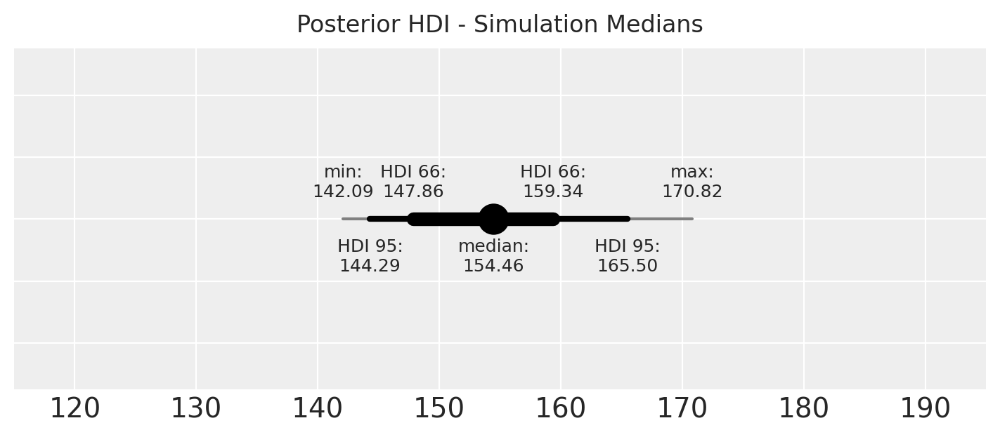

In [27]:
from helpsk.string import format_number

sim_min, sim_median, sim_max = np.quantile(posterior_target_point_predictions, q=[0, 0.5, 1])
sim_95_hdi_prob_low, sim_95_hdi_prob_hi = az.hdi(posterior_target_point_predictions, hdi_prob=0.95)
sim_66_hdi_prob_low, sim_66_hdi_prob_hi = az.hdi(posterior_target_point_predictions, hdi_prob=0.66)

def plot_text(x, label, above=True):
    y = 0.012
    if not above:
        y *= -1
    return plt.text(x=x, y=y, s=f"{label}:\n{format_number(x)}", ha='center', va='center', fontsize=9)

fig, ax = plt.subplots(1)
plt.plot([sim_min, sim_max], [0, 0], color='gray')
plt.plot([sim_95_hdi_prob_low, sim_95_hdi_prob_hi], [0, 0], color='black', linewidth=3)
plt.plot([sim_66_hdi_prob_low, sim_66_hdi_prob_hi], [0, 0], color='black', linewidth=7)
plt.plot(sim_median, 0, 'o', markersize=15, color='black')
ax.set_yticklabels([])
plot_text(x=sim_min, label='min')
plot_text(x=sim_max, label="max")
plot_text(x=sim_median, label="median", above=False)
plot_text(x=sim_66_hdi_prob_low, label="HDI 66")
plot_text(x=sim_66_hdi_prob_hi, label="HDI 66")
plot_text(x=sim_95_hdi_prob_low, label="HDI 95", above=False)
plot_text(x=sim_95_hdi_prob_hi, label="HDI 95", above=False)
plt.xlim((115, 195))
fig.set_size_inches(w=7, h=3)
plt.suptitle("Posterior HDI - Simulation Medians");

## Actual vs Predicted

In [28]:
import plotly_express as px

temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Predicted Heights"] = posterior_target_point_predictions

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Predicted Heights",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Prediction<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)

perfect_line = px.line(
    pd.DataFrame(dict(x=np.arange(135, 180), y=np.arange(135, 180))),
    x='x',
    y='y',
)
perfect_line.update_traces(line_color='red', line_width=2)
fig.add_trace(perfect_line.data[0])
fig


## Residuals

In [29]:
import plotly_express as px

temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Residuals"] = posterior_target_point_predictions - temp['Actual Heights']

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Residuals",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Residual (Predicted - Actual)<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)
fig.add_hline(y=0, line_width=3, line_color="red")
fig


---

# New Predictions

In [30]:
x = np.arange(30, 64)
prediction_sims = ph.posterior_predict(
    model=model_linear,
    idata_posterior=idata_posterior,
    data=x
)
prediction_sims.shape

Sampling: [height]


(34, 4000)

Text(0.5, 0.98, 'Predictions/Simulations vs Actual')

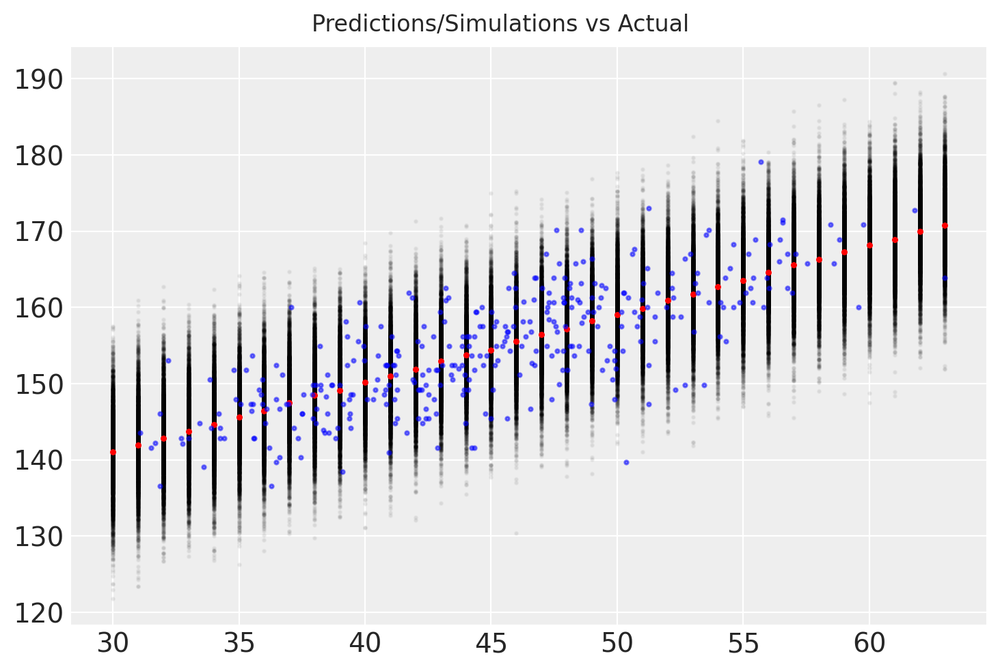

In [31]:
for index, value in enumerate(x):
    plt.scatter(
        np.repeat(value, prediction_sims.shape[1]),
        prediction_sims[index, :],
        color='black', alpha=0.05, s=2
    )
    plt.scatter(
        value,
        np.median(prediction_sims[index, :]),
        color='red', alpha=1, s=5,
    )
plt.scatter(
    data_adults.weight,
    data_adults.height,
    color='blue', alpha=0.5, s=4
);
plt.suptitle('Predictions/Simulations vs Actual')

Text(0.5, 0.98, 'Predictions/Simulations vs Actual')

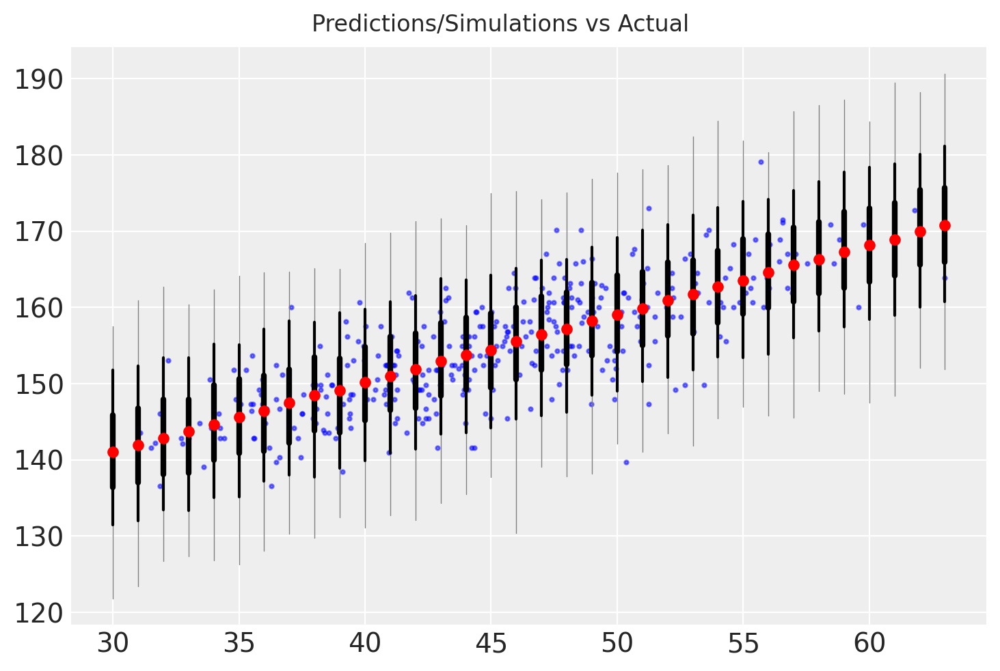

In [32]:
from helpsk.string import format_number

for index, value in enumerate(x):
    sims = prediction_sims[index, :]
    sim_min, sim_median, sim_max = np.quantile(sims, q=[0, 0.5, 1])
    sim_95_hdi_prob_low, sim_95_hdi_prob_hi = az.hdi(sims, hdi_prob=0.95)
    sim_66_hdi_prob_low, sim_66_hdi_prob_hi = az.hdi(sims, hdi_prob=0.66)
    

    plt.plot([value, value], [sim_min, sim_max], color='gray', linewidth=0.5)
    plt.plot([value, value], [sim_95_hdi_prob_low, sim_95_hdi_prob_hi], color='black', linewidth=1.5)
    plt.plot([value, value], [sim_66_hdi_prob_low, sim_66_hdi_prob_hi], color='black', linewidth=3)
    plt.plot(value, sim_median, 'o', markersize=5, color='red')

plt.scatter(
    data_adults.weight,
    data_adults.height,
    color='blue', alpha=0.5, s=4
);
plt.suptitle('Predictions/Simulations vs Actual')

---

In [33]:
x = np.arange(30, 64)
idata_ooo_sims = ph.posterior_predict_inference(
    model=model_linear,
    idata_posterior=idata_posterior,
    data=x
)
idata_ooo_sims

Sampling: [height]


Inference data with groups:
	> posterior_predictive
	> observed_data
	> constant_data

/tmp/ipykernel_75404/788556797.py:3: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



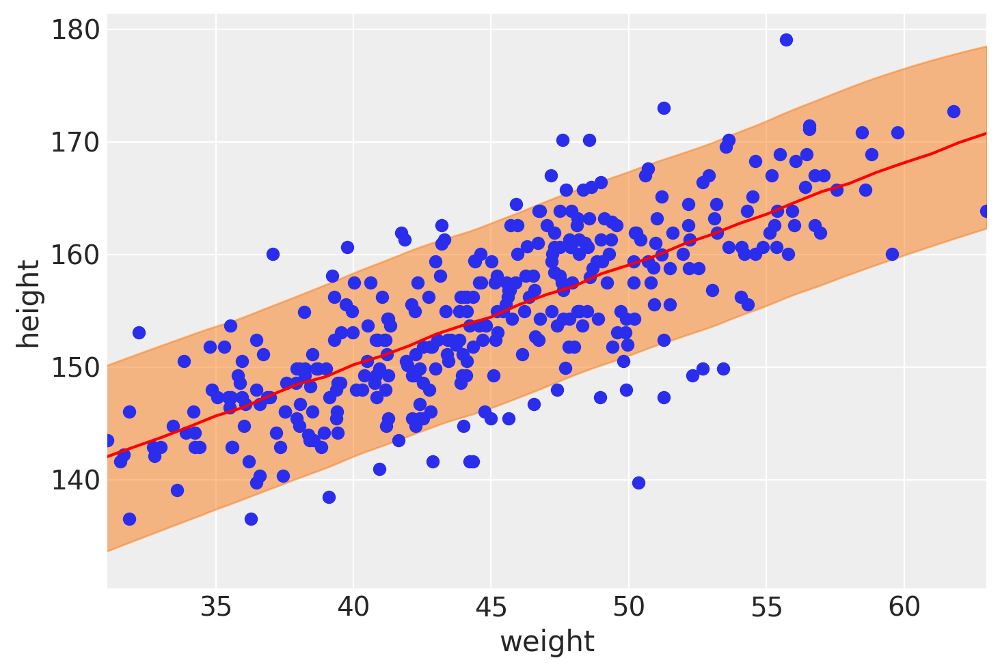

In [34]:
ax = az.plot_hdi(x=x, y=idata_ooo_sims.posterior_predictive['height'], hdi_prob=0.89)
plt.scatter(data_adults.weight, data_adults.height)
plt.plot(x, np.median(prediction_sims, axis=1), "k", color='red')
plt.xlabel("weight")
plt.ylabel("height")
plt.xlim(data_adults.weight.min(), data_adults.weight.max());

---

# Model - Polynomial

In [35]:
adults_stan = data_adults.copy()
adults_stan['weight_std'] = (adults_stan.weight - adults_stan.weight.mean()) / adults_stan.weight.std()
adults_stan['weight_std_2'] = adults_stan.weight_std**2
adults_stan = adults_stan[['height', 'weight_std', 'weight_std_2']]
adults_stan

,height,weight_std,weight_std_2
0,151.765,0.439097,0.192806
1,139.700,-1.317185,1.734976
2,136.525,-2.032870,4.132560
3,156.845,1.246987,1.554976
4,145.415,-0.575156,0.330804
...,...,...,...
534,162.560,0.316157,0.099955
537,142.875,-1.664051,2.769065
540,162.560,1.110875,1.234043
541,156.210,1.405052,1.974171


In [55]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

pipeline = make_pipeline(StandardScaler(), PolynomialFeatures(3, include_bias=False))

X = data_adults.copy()[['weight']]
y = data_adults['height']

X = pipeline.fit_transform(X)
X.shape


(352, 3)

In [56]:
pipeline

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('polynomialfeatures',
                 PolynomialFeatures(degree=3, include_bias=False))])

In [57]:
with pm.Model() as model_poly:
    # this is so we can update the data to make out of sample predictions
    X = pm.MutableData("X", X)
    y = pm.MutableData("y", y)

    a = pm.Normal("a", mu=178, sigma=100)
    b1 = pm.Lognormal("b1", mu=0, sigma=1)
    b2 = pm.Normal("b2", mu=0, sigma=1)
    b3 = pm.Normal("b3", mu=0, sigma=1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + b1 * X[:, 0] + b2 * X[:, 1] + b3 * X[:, 2])
    height = pm.Normal("height", mu=mu, sigma=sigma, observed=y)
    idata_posterior_poly = pm.sample(1000, tune=1000)
    idata_predictive_poly = pm.sample_posterior_predictive(
        idata_posterior_poly,
        random_seed=RANDOM_SEED
    )

    # a = pm.Normal("a", mu=178, sigma=20)
    # # lognormal means there will be >0 relationship between b (weight) and height
    # # i.e. we are explicitly stating that negative relationships don't make sense
    # b = pm.Lognormal("b", mu=0, sigma=1)
    # sigma = pm.Uniform("sigma", 0, 50)
    # # mu = a + np.exp(b) * (d2.weight.values - xbar)
    # # mu = a + np.exp(b) * (np.zeros(len(d2)) - d2.weight.mean())
    # mu = a + b * (X - x_bar)
    # height = pm.Normal("height", mu=mu, sigma=sigma, observed=y)
    # # trace_4_3b = pm.sample(1000, tune=1000)
    # idata_prior = pm.sample_prior_predictive(samples=100, random_seed=RANDOM_SEED)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b1, b2, b3, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.
Sampling: [height]


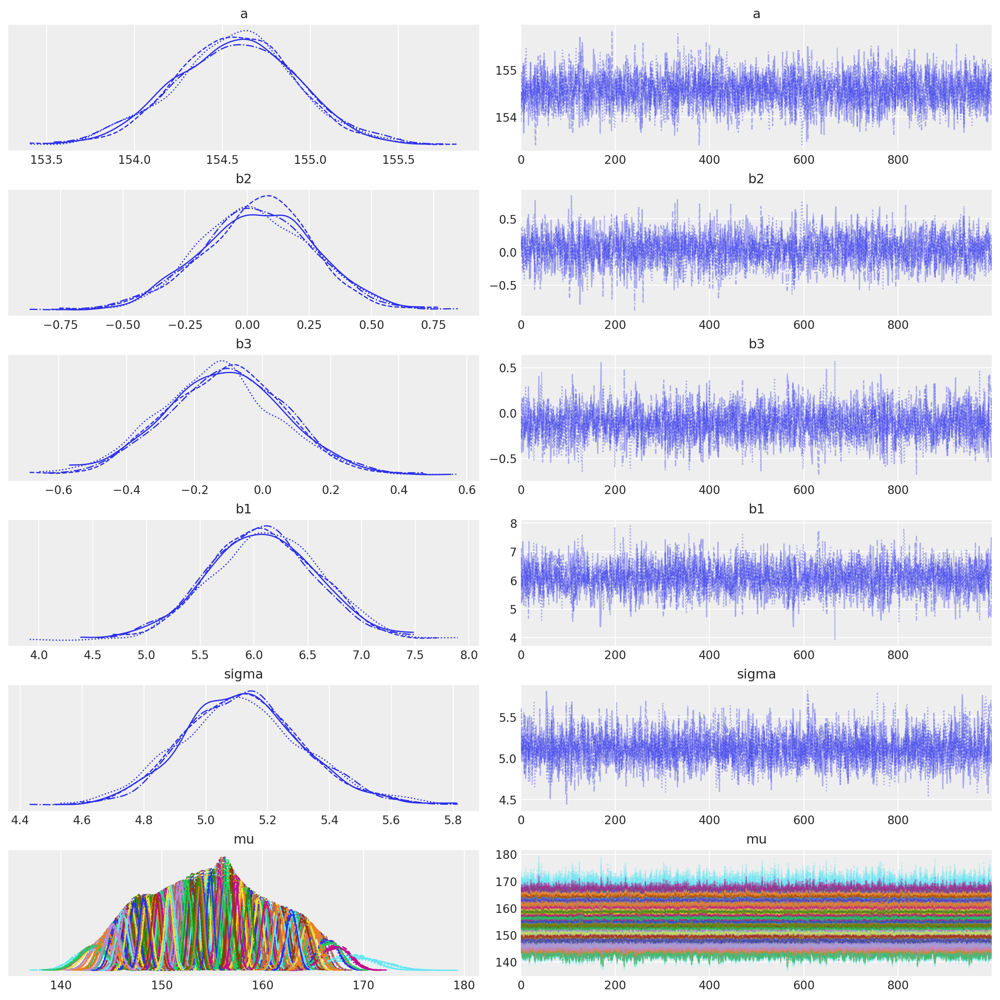

In [58]:
az.plot_trace(idata_posterior_poly);

In [67]:
import statsmodels.api as sm
ols_X = data_adults.copy()[['weight']]
ols_y = data_adults['height']

ols_X = pipeline.transform(ols_X)

ols_X = sm.add_constant(ols_X)
ols_model = sm.OLS(ols_y, ols_X).fit() 
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:                 height   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     154.1
Date:                Sun, 15 Jan 2023   Prob (F-statistic):           1.54e-63
Time:                        21:36:16   Log-Likelihood:                -1070.7
No. Observations:                 352   AIC:                             2149.
Df Residuals:                     348   BIC:                             2165.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        154.5685      0.356    434.616      0.0

In [68]:
import plotly_express as px

ols_predictions = ols_model.predict(ols_X)
temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Predicted Heights (OLS)"] = ols_predictions

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Predicted Heights (OLS)",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Prediction (OLS)<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)

perfect_line = px.line(
    pd.DataFrame(dict(x=np.arange(135, 180), y=np.arange(135, 180))),
    x='x',
    y='y',
)
perfect_line.update_traces(line_color='red', line_width=2)
fig.add_trace(perfect_line.data[0])
fig


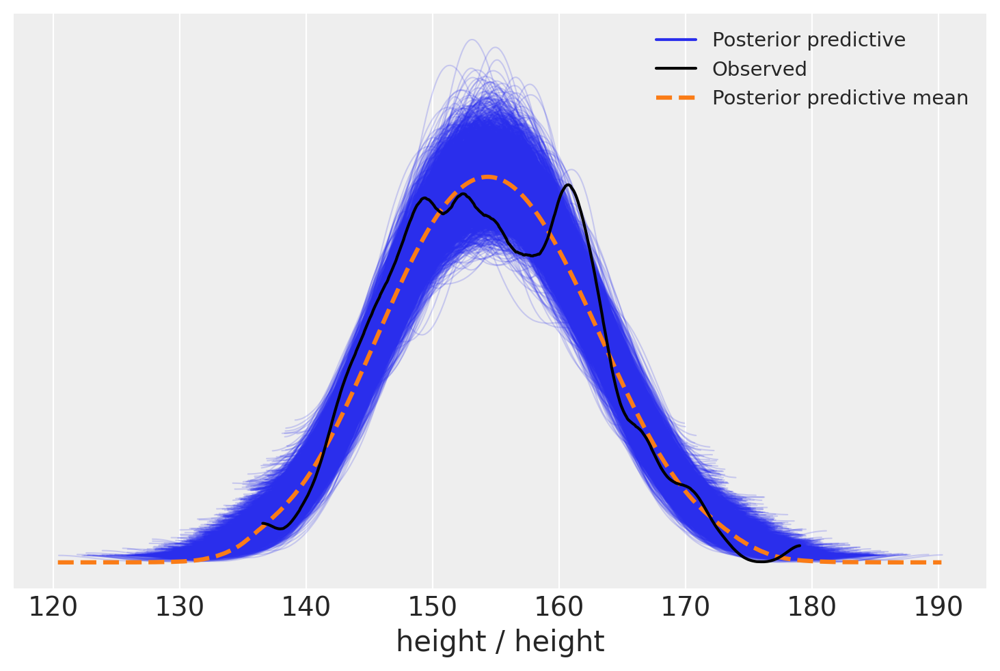

In [59]:
az.plot_ppc(idata_predictive_poly);

In [60]:
posterior_samples_poly = ph.get_posterior_samples(idata_predictive_poly)
posterior_point_predictions_poly = np.median(posterior_samples_poly, axis=1)
assert posterior_samples_poly.shape[0] == len(posterior_point_predictions_poly)

In [63]:
posterior_target_point_predictions

array([157.29216318, 146.82934503, 142.75685193, 161.95648478,
       151.11436779, 170.82333135, 148.3078169 , 163.88046166,
       145.57180367, 163.11223493, 159.01360054, 151.25901354,
       146.43933473, 157.11910507, 144.65670266, 157.9418547 ,
       152.28580038, 148.57430236, 158.09198971, 152.71335389,
       145.97838023, 148.26953373, 146.05454938, 150.33661781,
       163.94878925, 147.86115601, 148.73188789, 156.29023386,
       149.14537361, 146.28055988, 156.67921652, 156.9302718 ,
       158.56985773, 158.36231576, 165.06265065, 149.20517953,
       159.04139285, 151.31647167, 148.60688837, 152.18638833,
       154.27402231, 166.89954278, 156.26588611, 154.02628665,
       159.99841281, 162.79191882, 155.31863064, 157.36743907,
       161.07312233, 156.95368124, 155.32965678, 152.25203039,
       146.83719227, 164.55459602, 147.55745533, 157.50818724,
       147.49277315, 156.60446147, 156.82249481, 166.10390393,
       148.09621495, 156.67109131, 153.01896914, 159.41

In [64]:
posterior_point_predictions_poly

array([157.40438616, 146.85583886, 143.32679577, 162.09984639,
       151.02976197, 169.32640537, 148.15279081, 163.88484369,
       145.62575561, 163.21067572, 159.13314836, 151.04111849,
       146.43152814, 157.20471623, 144.89036657, 158.0453216 ,
       152.20449803, 148.47764753, 158.18388432, 152.61809161,
       145.96699854, 148.14001573, 146.14946495, 150.13137736,
       163.91359286, 147.77883719, 148.60223954, 156.3579608 ,
       148.95939512, 146.32102611, 156.78883317, 157.06369473,
       158.70626741, 158.55048976, 164.96260208, 149.0660966 ,
       159.15534086, 151.11779931, 148.48772776, 152.10893402,
       154.19498699, 166.65200359, 156.25692553, 153.90944539,
       160.15582542, 162.87017167, 155.33958416, 157.40635601,
       161.2551529 , 157.04949493, 155.30311496, 152.13988487,
       146.7834241 , 164.55948893, 147.48112466, 157.64563652,
       147.39434239, 156.60392446, 156.83596626, 165.90867714,
       148.03051841, 156.78835255, 152.9266835 , 159.57

In [65]:
import plotly_express as px

temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Predicted Heights"] = posterior_point_predictions_poly

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Predicted Heights",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Prediction<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)

perfect_line = px.line(
    pd.DataFrame(dict(x=np.arange(135, 180), y=np.arange(135, 180))),
    x='x',
    y='y',
)
perfect_line.update_traces(line_color='red', line_width=2)
fig.add_trace(perfect_line.data[0])
fig


In [44]:
new_data = pd.DataFrame(dict(weight=np.arange(30, 64)))
new_X = pipeline.transform(new_data)
new_X.shape

(34, 2)

In [45]:

prediction_sims = ph.posterior_predict(
    model=model_poly,
    idata_posterior=idata_posterior_poly,
    data=new_X
)
prediction_sims.shape

Sampling: [height]


(34, 4000)

In [46]:
import plotly_express as px

temp = data_adults.copy()
temp.rename(columns={'height': "Actual Heights"}, inplace=True)
temp["Predicted Heights"] = np.median(prediction_sims, axis=1)

fig = px.scatter(
    temp,
    x="Actual Heights",
    y="Predicted Heights",
    trendline='lowess',
    trendline_options=dict(frac=0.1),
    title="Actual vs Prediction<br><sup>red line is perfect fit; blue line is actual fit</sup>",
)

perfect_line = px.line(
    pd.DataFrame(dict(x=np.arange(135, 180), y=np.arange(135, 180))),
    x='x',
    y='y',
)
perfect_line.update_traces(line_color='red', line_width=2)
fig.add_trace(perfect_line.data[0])
fig


ValueError: Length of values (34) does not match length of index (352)